# Introduction
This strategy, named Breakout, is a trend-following algorithm that uses highest high and the lowest low indicators over a specified period to generate trading signals.

The strategy initiates a long position when the current price surpasses the highest price of the look-back period and a short position when the current price falls below the lowest price of the look-back period. It closes existing long positions if the price drops below the previous period's high and closes short positions if the price rises above the previous period's low. The strategy's behavior can be configured to only go long,only go short, or both.

DISCLAMER: Please remember, this is a demo based on a synthetic data, the actual performance of this algo is immaterial

# Step 1) Data Preparation
To prepare the data we read using Athena (and SQL, rather than reading from a bucket as an object), deploy dependencies locally on the Notebook instance, indexes by date and splits the data into a training and validation datasets. 

In [13]:
%run init_model.py 'algo_daily_breakout'

algo_daily_breakout


In [14]:
# get S3 bucket
s3bucket=!(aws s3 ls | grep algotrading- | awk  '{print $3}')
s3bucket=s3bucket[0]
s3bucket

'algotrading-demo-ver1'

In [15]:
import sys
!{sys.executable} -m pip install PyAthena
!{sys.executable} -m pip install --upgrade numexpr

In [16]:
import os
import sagemaker as sage
from sagemaker import get_execution_role
import datetime
from sagemaker.tensorflow import TensorFlow
import json

role = get_execution_role()
sess = sage.Session()
region = sess.boto_session.region_name

In [28]:
import pandas as pd
from sqlalchemy import create_engine
from pyathena import connect
connection_string = 'awsathena+rest://@'+region+'?s3_staging_dir=s3://'+s3bucket+'/results/'
engine = create_engine(connection_string)
# We use SQL to query the data, not reading the files
df = pd.read_sql("SELECT dt,open,high,low,close,vol FROM algo_data.hist_data_daily;", engine)
df.set_index(pd.DatetimeIndex(df['dt']),inplace=True)
del df['dt']
df.to_csv('local/'+algo_name+'/input/data/training/data.csv')
df.head()

,open,high,low,close,vol
dt,,,,,
2012-08-13,26.76,26.83,26.41,26.69,23623918.0
2012-08-14,26.80,26.81,26.38,26.48,27477260.0
2012-08-15,26.23,26.47,26.19,26.27,26081909.0
2012-08-16,26.44,26.65,26.34,26.59,25702363.0
2012-08-17,26.57,26.63,26.21,26.33,30379903.0


<Axes: xlabel='dt'>

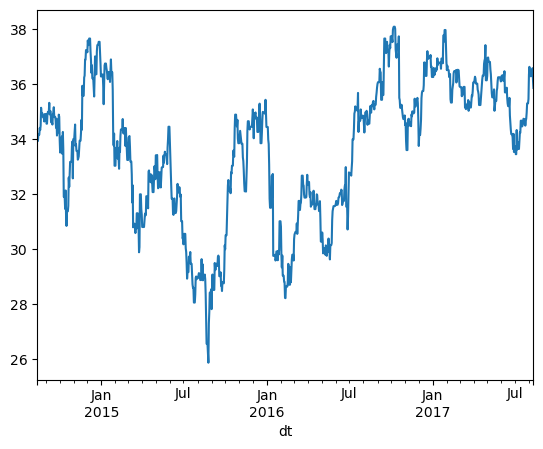

In [36]:
%matplotlib inline
# Draw closing prices. Not sure why I draw it here, just a pretty chart
dfTest["close"].plot()

# Step 2) Modify Strategy Configuration 

In the following cell, you can adjust the parameters for the strategy.

* `go_long` = Go Long for Breakout (true or false)
* `go_short` = Go Short for Breakout (true or false)
* `period` = Length of window for previous high and low
* `size` = The number of shares for a transaction

`Tip`: A good starting point for improving the strategy is to lengthen the period of the previous high and low. Equity Markets tend to have a long bias and if you only consider long trades this might improve the performance.

In [37]:
%%writefile local/{algo_name}/input/config/hyperparameters.json
{ "go_long" : "true",
  "go_short" : "true",
  "period" : "50",
  "size" : "100"
}

Overwriting local/algo_daily_breakout/input/config/hyperparameters.json


In [38]:
%run update_config.py $algo_name

config={"go_long": "true", "go_short": "true", "period": "50", "size": "100", "algo_name": "algo_daily_breakout", "user": "user", "account": "616431823260", "region": "us-east-1"}


<Figure size 640x480 with 0 Axes>

# Step 3) Modify Strategy Code

`Tip`: A good starting point for improving the strategy is to add additional indicators like ATR (Average True Range) before placing a trade. You want to avoid false signals if there is not enough volatility.

Here are some helpful links:
* Backtrader Documentation: https://www.backtrader.com/docu/strategy/
* TA-Lib Indicator Reference: https://www.backtrader.com/docu/talibindautoref/
* Backtrader Indicator Reference: https://www.backtrader.com/docu/indautoref/

In [39]:
%%writefile model/{algo_name}.py
import backtrader as bt
from algo_base import *
import pytz
from pytz import timezone

class MyStrategy(StrategyTemplate):

    def __init__(self):  # Initiation
        super(MyStrategy, self).__init__()
        self.config["period"]=int(self.config["period"])
        self.config["size"]=int(self.config["size"])
        self.config["go_long"]=(str(self.config["go_long"]).lower()=="true")
        self.config["go_short"]=(str(self.config["go_short"]).lower()=="true")

        self.highest = bt.ind.Highest(period=self.config["period"])
        self.lowest = bt.ind.Lowest(period=self.config["period"])
        self.size = self.config["size"]
        
    # Set the cash and commissions
    def init_broker(broker):
        broker.setcash(100000.0)
        broker.setcommission(commission=0.0) 
        
    # Cerebro is the algo engine of the backtesting library. We add market data here
    def add_data(cerebro):
        data = btfeeds.GenericCSVData(
            dataname=MyStrategy.TRAIN_FILE,
            dtformat=('%Y-%m-%d'),
            timeframe=bt.TimeFrame.Days,
            # These are just indecies of the columns in the file
            datetime=0,
            time=-1,
            high=2,
            low=3,
            open=1,
            close=4,
            volume=5,
            openinterest=-1
        )
        cerebro.adddata(data)

    # Process next data (here we deal with daily bars)
    def next(self):  # Processing
        super(MyStrategy, self).next()
        dt=self.datas[0].datetime.datetime(0)
        if not self.position:
            # If 'go_long' is enabled and the current close price is greater than the previous highest high
            if self.config["go_long"] and self.datas[0] > self.highest[-1]:
                self.buy(size=self.size) # Go long
            # Else if 'go_short' is enabled and the current close price is less than the previous lowest low              
            elif self.config["go_short"] and self.datas[0] < self.lowest[-1]:
                self.sell(size=self.size) # Go short
        # If there is an open long position (size > 0) and the current close price drops below the previous highest high               
        elif self.position.size>0 and self.datas[0] < self.highest[-1]:
            self.close() # Close the long position
        # If there is an open short position (size < 0) and the current close price rises above the previous lowest low           
        elif self.position.size<0 and self.datas[0] > self.lowest[-1]:          
            self.close()  # Close the short position

Overwriting model/algo_daily_breakout.py


# Step 4) Backtest Locally
In this phase we create a container, which consists of the execution environment (defined in the Dockerfile), maps the local storage which contains data and hyperparameters, and uses functionality from the backtesting library to calculate the performance of the strategy - win/loss streak. drawdown, PnL, etc.  
Please note that the initial docker build may take a few minutes. Subsequent runs are fast

In [40]:
#Build Local Algo Image
!docker build -t $algo_name .
!docker run -v $(pwd)/local/$algo_name:/opt/ml --rm $algo_name train

[+] Building 0.0s (0/1)                                          docker:default
[+] Building 0.1s (2/2)                                          docker:default
 => [internal] load build definition from Dockerfile                       0.0s
 => => transferring dockerfile: 1.08kB                                     0.0s
 => [internal] load metadata for docker.io/tensorflow/tensorflow:2.19.0    0.1s
[+] Building 0.2s (22/22)                                        docker:default
 => [internal] load .dockerignore                                          0.0s
 => => transferring context: 2B                                            0.0s
 => [ 1/18] FROM docker.io/tensorflow/tensorflow:2.19.0@sha256:f24e8494d4  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 3.15kB                                        0.0s
 => CACHED [ 2/18] RUN apt-get -y update &&          apt-get install -y -  0.0s
 => CACHED [ 3/18] RUN wget  https://git

[+] Building 2.6s (4/24)                                         docker:default
 => => transferring dockerfile: 1.34kB                                     0.0s
 => [internal] load metadata for docker.io/tensorflow/tensorflow:2.1.0rc2  0.4s
 => [internal] load .dockerignore                                          0.0s
 => => transferring context: 2B                                            0.0s
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  2.1s
 => => resolve docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655cc4  0.0s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d93

[+] Building 3.1s (4/24)                                         docker:default
 => => transferring dockerfile: 1.34kB                                     0.0s
 => [internal] load metadata for docker.io/tensorflow/tensorflow:2.1.0rc2  0.4s
 => [internal] load .dockerignore                                          0.0s
 => => transferring context: 2B                                            0.0s
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  2.6s
 => => resolve docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655cc4  0.0s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d93

[+] Building 3.7s (4/24)                                         docker:default
 => => transferring dockerfile: 1.34kB                                     0.0s
 => [internal] load metadata for docker.io/tensorflow/tensorflow:2.1.0rc2  0.4s
 => [internal] load .dockerignore                                          0.0s
 => => transferring context: 2B                                            0.0s
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  3.2s
 => => resolve docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655cc4  0.0s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d93

[+] Building 4.2s (4/24)                                         docker:default
 => => transferring dockerfile: 1.34kB                                     0.0s
 => [internal] load metadata for docker.io/tensorflow/tensorflow:2.1.0rc2  0.4s
 => [internal] load .dockerignore                                          0.0s
 => => transferring context: 2B                                            0.0s
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  3.7s
 => => resolve docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655cc4  0.0s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d93

[+] Building 4.8s (4/24)                                         docker:default
 => => transferring dockerfile: 1.34kB                                     0.0s
 => [internal] load metadata for docker.io/tensorflow/tensorflow:2.1.0rc2  0.4s
 => [internal] load .dockerignore                                          0.0s
 => => transferring context: 2B                                            0.0s
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  4.3s
 => => resolve docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655cc4  0.0s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d93

[+] Building 5.3s (4/24)                                         docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  4.9s
 => => resolve docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655cc4  0.0s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3

[+] Building 5.8s (4/24)                                         docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  5.4s
 => => resolve docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655cc4  0.0s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3

[+] Building 6.3s (4/24)                                         docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  5.8s
 => => resolve docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655cc4  0.0s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3

[+] Building 7.0s (4/24)                                         docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  6.5s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 7.4s (4/24)                                         docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  7.0s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 7.9s (4/24)                                         docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  7.4s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 8.5s (4/24)                                         docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  8.0s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 8.9s (4/24)                                         docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  8.5s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 9.4s (4/24)                                         docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  8.9s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 9.9s (4/24)                                         docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  9.4s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 10.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655c  9.9s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 10.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  10.4s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 11.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  10.8s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 11.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  11.3s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 12.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  11.8s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 12.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  12.3s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 13.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  12.8s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 13.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  13.3s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 14.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  13.9s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 14.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  14.3s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 15.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  15.1s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 16.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  15.6s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 16.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  16.3s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 17.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  16.9s
 => => sha256:021062082fece104d2042f0366629599cb12930fd2c 6.25kB / 6.25kB  0.0s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b37869

[+] Building 18.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  17.6s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860

[+] Building 18.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  18.1s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860

[+] Building 19.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  18.7s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860

[+] Building 19.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  19.2s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860

[+] Building 20.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  19.9s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860

[+] Building 20.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  20.4s
 => => sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae48 35.36kB / 35.36kB  0.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860

[+] Building 21.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  21.0s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  21.0s
 => => sha256:ebd070d705f09d141ecd821902

[+] Building 22.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  21.8s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  21.8s
 => => sha256:ebd070d705f09d141ecd821902

[+] Building 22.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  22.3s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  22.3s
 => => sha256:ebd070d705f09d141ecd821902

[+] Building 23.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  23.1s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  23.1s
 => => sha256:ebd070d705f09d141ecd821902

[+] Building 24.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  23.8s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  23.8s
 => => sha256:ebd070d705f09d141ecd821902

[+] Building 25.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  24.5s
 => => sha256:655cc41c46b839623313eb15c2ceb1efb7f71397ce6 2.62kB / 2.62kB  0.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  24.5s
 => => sha256:ebd070d705f09d141ecd821902

[+] Building 25.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  25.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 26.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  25.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 26.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  26.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 26.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  26.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 27.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  26.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 27.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  27.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 28.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  27.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 28.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  28.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 29.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  28.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 29.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  29.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 30.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  29.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 30.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  30.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 31.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  30.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 31.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  31.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 32.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  31.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 32.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  31.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 32.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  32.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 33.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  32.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 33.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  33.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 34.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  33.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 34.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  34.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 35.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  34.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 35.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  35.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 36.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  35.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 36.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  36.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 37.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  36.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 37.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  36.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 37.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  37.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 38.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  37.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 38.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  38.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 39.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  38.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 39.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  39.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 40.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  39.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 40.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  40.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 41.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  40.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 41.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  41.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 42.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  41.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 42.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  42.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 43.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  42.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 43.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  43.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 44.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  43.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 44.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  43.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 44.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  44.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 45.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  44.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 45.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  45.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 46.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  45.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 46.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  46.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 47.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  46.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 47.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  47.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 48.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  47.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 48.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  48.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 48.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  48.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 49.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  48.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 49.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  49.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 50.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  49.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 50.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  50.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 51.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  50.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 51.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  51.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 52.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  51.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 52.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  52.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 53.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  52.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 53.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  53.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 53.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  53.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 54.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  53.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 54.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  54.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 55.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  54.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 55.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  55.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 56.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  55.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 56.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  56.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 56.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  56.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 57.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  56.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 57.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  57.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 58.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  57.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 58.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  58.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 59.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  58.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 59.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  59.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 60.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  59.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 60.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  60.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 60.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  60.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 61.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  60.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 61.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  61.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 62.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  61.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 62.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  62.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 63.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  62.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 63.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  63.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 64.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  63.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 64.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  64.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 65.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  64.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 65.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  64.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 65.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  65.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 66.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  65.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 66.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  66.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 67.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  66.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 67.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  67.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 68.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  67.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 68.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  68.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 69.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  68.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 69.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  69.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 69.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  69.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 70.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  69.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 70.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  70.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 71.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  70.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 71.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  71.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 72.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  71.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 72.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  72.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 73.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  72.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 73.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  73.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 73.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  73.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 74.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  74.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 74.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  74.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 75.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  74.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 75.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  75.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 76.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  75.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 76.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  76.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 77.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  76.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 77.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  77.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 78.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  77.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 78.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  77.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 78.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  78.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 79.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  78.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 79.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  79.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 80.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  79.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 80.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  79.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 80.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  80.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 81.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  80.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 81.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  81.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 82.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  81.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 82.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  82.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 83.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  82.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 83.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  83.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 83.9s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  83.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 84.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  83.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 84.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  84.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 85.3s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  84.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 85.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  85.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 86.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  85.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 86.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  86.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 87.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  86.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 87.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  87.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 88.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  87.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 88.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  87.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 88.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  88.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 89.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  88.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 89.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  89.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 90.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  89.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 90.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  90.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 91.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  90.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 91.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  91.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 92.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  91.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 92.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  92.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 93.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  92.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 93.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  93.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 94.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  93.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 94.7s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  94.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 95.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  94.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 95.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  95.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 95.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  95.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 96.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  95.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 96.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  96.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 97.1s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  96.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 97.4s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  96.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 98.0s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  97.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 98.5s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  98.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 98.8s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  98.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 99.2s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  98.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 99.6s (4/24)                                        docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  99.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 100.1s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:655  99.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 100.5s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  100.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 100.9s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  100.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 101.4s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  100.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 101.7s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  101.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 102.1s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  101.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 102.6s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  102.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 103.0s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  102.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 103.4s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  103.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 103.9s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  103.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 104.3s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  103.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 104.7s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  104.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 105.1s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  104.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 105.6s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  105.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 105.9s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  105.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 106.4s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  105.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 106.9s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  106.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 107.3s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  106.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 107.7s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  107.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 108.1s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  107.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 108.5s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  108.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 109.1s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  108.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 109.5s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  109.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 109.9s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  109.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 110.4s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  109.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 110.8s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  110.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 111.3s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  110.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 111.6s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  111.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 112.0s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  111.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 112.6s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  112.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 113.1s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  112.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 113.5s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  113.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 113.8s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  113.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 114.1s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  113.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 114.5s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  114.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 115.0s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  114.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 115.5s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  115.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 115.9s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  115.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 116.5s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  116.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 116.9s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  116.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 117.3s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  116.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 117.8s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  117.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 118.2s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  117.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 118.7s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  118.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 119.1s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  118.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 119.5s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  119.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 120.0s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  119.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 120.5s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  120.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 121.0s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  120.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 121.4s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  120.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 121.8s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  121.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 122.3s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  121.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 122.7s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  122.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 123.2s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  122.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 123.8s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  123.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 124.2s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  123.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 124.5s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  124.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 124.8s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  124.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 125.1s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  124.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 125.6s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  125.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 126.1s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  125.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 126.4s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  125.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 126.9s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  126.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 127.3s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  126.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 127.8s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  127.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 128.3s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  127.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 128.7s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  128.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 129.1s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  128.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 129.6s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  129.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 130.0s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  129.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

 => => transferring context: 110.42kB                                      0.0s
[+] Building 130.5s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  130.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd821902

[+] Building 130.9s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  130.5s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 131.4s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  130.9s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 131.8s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  131.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 132.3s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  131.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 132.7s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  132.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
[+] Building 133.0s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  132.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860

[+] Building 133.6s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  133.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 134.2s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  133.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 134.6s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  134.2s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 135.1s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  134.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 135.6s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  135.1s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 136.0s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  135.6s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 136.4s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  136.0s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 136.9s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  136.4s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 137.2s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  136.8s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 137.8s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  137.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 138.2s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  137.7s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 138.8s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  138.3s
 => => sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556d 854B / 854B  0.1s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f

[+] Building 139.3s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  138.8s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111

[+] Building 139.9s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  139.4s
 => => sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa 26.69MB / 26.69MB  0.4s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111

[+] Building 140.3s (4/24)                                       docker:default
 => [ 1/20] FROM docker.io/tensorflow/tensorflow:2.1.0rc2-py3@sha256:65  139.9s
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de406

[+] Building 140.9s (5/24)                                       docker:default
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784

[+] Building 141.5s (5/24)                                       docker:default
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784

[+] Building 142.1s (5/24)                                       docker:default
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784

[+] Building 142.7s (5/24)                                       docker:default
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784

[+] Building 143.3s (5/24)                                       docker:default
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784

[+] Building 143.9s (5/24)                                       docker:default
 => => sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b 163B / 163B  0.1s
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784

[+] Building 144.5s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

 => => # Get:11 http://archive.ubuntu.com/ubuntu bionic-updates/restricted amd6
 => => # 4 Packages [1728 kB]                                                  
[+] Building 144.9s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f

[+] Building 145.5s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 146.0s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 146.6s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 147.2s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 147.8s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 148.4s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 149.0s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 149.6s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 150.2s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 150.8s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

 => => # Reading package lists...                                              
 => => # Reading package lists...                                              
[+] Building 151.4s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f

[+] Building 151.9s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 152.4s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 153.0s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 153.6s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 154.0s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 154.5s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 155.0s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 155.5s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 156.1s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 156.6s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

 => => # debconf: (TERM is not set, so the dialog frontend is not usable.)     
 => => # debconf: falling back to frontend: Readline                           
[+] Building 157.1s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f

[+] Building 157.7s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 158.1s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 158.8s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 159.4s (5/24)                                       docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 159.9s (6/24)                                       docker:default
 => => sha256:77b58275faf490ff0409fd6bba1b06151e94042 147.69MB / 147.69MB  4.7s
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa886

[+] Building 160.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 161.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 161.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 162.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 162.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 163.1s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 163.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 164.1s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 164.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 165.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 165.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 166.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 166.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 167.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 167.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 168.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 169.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 169.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 169.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 170.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 170.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 171.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 171.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 172.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 172.6s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 173.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 173.6s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 174.1s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 174.6s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 175.1s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 175.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 176.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 176.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 176.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 177.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 177.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 178.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 178.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 179.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 179.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 180.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 180.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 181.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 181.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 182.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 182.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 183.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 184.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 184.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 184.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 185.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 186.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 186.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 187.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 187.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 188.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 188.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 189.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 189.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 190.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 190.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 191.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 191.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 192.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 192.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 193.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 194.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 194.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 195.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 195.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 195.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 196.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 196.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 197.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 197.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 198.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 198.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 199.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 200.1s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 200.6s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 201.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 201.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 202.1s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 202.6s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 203.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 203.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 203.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 204.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 204.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 205.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 206.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 206.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 206.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 207.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 207.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 208.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 209.1s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 209.6s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 210.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 210.6s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 211.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 211.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 212.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 212.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 213.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 213.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 213.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 214.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 214.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 215.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 215.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 216.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 216.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 217.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 217.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 218.1s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 218.6s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 219.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 219.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 220.1s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 220.6s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 221.1s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 221.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 222.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 222.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 223.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 223.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 224.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 224.6s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 225.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 225.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 226.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 226.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 227.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 227.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 228.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 228.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 229.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 230.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 230.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 230.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 231.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 231.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 232.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 232.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 233.1s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 233.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 234.2s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 234.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 235.1s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 235.6s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 236.0s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 236.5s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 237.1s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 237.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 238.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 238.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 239.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 239.8s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 240.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 240.7s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 241.3s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 241.9s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 242.4s (6/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 242.9s (7/24)                                       docker:default
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490f

[+] Building 243.5s (7/24)                                       docker:default
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490f

[+] Building 244.1s (7/24)                                       docker:default
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490f

[+] Building 244.7s (7/24)                                       docker:default
 => => sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e2 26.47MB / 26.47MB  0.9s
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490f

 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       2.7s
[+] Building 245.2s (7/24)                                       docker:default
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa886

[+] Building 245.8s (7/24)                                       docker:default
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 246.4s (7/24)                                       docker:default
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 247.0s (7/24)                                       docker:default
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 247.6s (7/24)                                       docker:default
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 248.2s (8/24)                                       docker:default
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04b

[+] Building 248.8s (8/24)                                       docker:default
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04b

[+] Building 249.3s (9/24)                                       docker:default
 => => extracting sha256:2746a4a261c9e18bfd7ff0429c18fd7522acc14fa4c7ec8a  2.5s
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04b

[+] Building 249.9s (9/24)                                       docker:default
 => => sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f 3.48MB / 3.48MB  0.6s
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f

 => [ 6/20] RUN pip install ta-lib                                         1.0s
 => => # Collecting ta-lib                                                     
[+] Building 250.6s (9/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366

[+] Building 251.2s (9/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 251.8s (9/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 252.4s (9/24)                                       docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 252.8s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 253.4s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 254.0s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 254.6s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 255.2s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

 => => #   Getting requirements to build wheel: finished with status 'done'    
 => => #   Installing backend dependencies: started                            
[+] Building 255.8s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 256.4s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 257.0s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 257.6s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 258.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 258.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 259.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 259.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 260.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 261.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 261.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 262.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 262.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 263.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 264.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 264.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

 => => # Building wheels for collected packages: ta-lib                        
 => => #   Building wheel for ta-lib (pyproject.toml): started                 
[+] Building 265.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 265.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 266.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 267.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 267.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 268.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 268.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 269.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 270.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 270.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 271.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 271.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 272.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 273.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 273.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

 => => # Building wheels for collected packages: ta-lib                        
 => => #   Building wheel for ta-lib (pyproject.toml): started                 
[+] Building 274.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 274.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 275.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 276.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 276.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 277.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 277.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 278.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 279.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 279.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 280.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

 => => # Building wheels for collected packages: ta-lib                        
 => => #   Building wheel for ta-lib (pyproject.toml): started                 
[+] Building 280.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 281.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 282.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 282.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 283.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 283.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 284.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

 => => # Building wheels for collected packages: ta-lib                        
 => => #   Building wheel for ta-lib (pyproject.toml): started                 
[+] Building 285.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 285.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 286.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 286.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 287.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 288.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 288.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 289.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 289.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 290.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 291.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 291.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 292.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 292.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 293.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 294.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 294.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 295.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 295.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 296.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

 => => # Building wheels for collected packages: ta-lib                        
 => => #   Building wheel for ta-lib (pyproject.toml): started                 
[+] Building 297.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 297.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 298.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 298.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 299.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 300.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 300.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 301.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 301.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 302.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 303.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 303.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 304.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 304.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 305.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 306.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 306.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

 => => # Building wheels for collected packages: ta-lib                        
 => => #   Building wheel for ta-lib (pyproject.toml): started                 
[+] Building 307.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 307.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

 => => # Building wheels for collected packages: ta-lib                        
 => => #   Building wheel for ta-lib (pyproject.toml): started                 
[+] Building 308.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 309.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

 => => # Building wheels for collected packages: ta-lib                        
 => => #   Building wheel for ta-lib (pyproject.toml): started                 
[+] Building 309.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 310.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 310.9s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 311.5s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 312.1s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 312.7s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 313.3s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

 => => # Successfully built ta-lib                                             
 => => # Installing collected packages: ta-lib                                 
[+] Building 314.0s (9/24)                                       docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 314.5s (10/24)                                      docker:default
 => => sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d 172B / 172B  0.8s
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366

[+] Building 315.0s (10/24)                                      docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 315.5s (11/24)                                      docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 316.1s (11/24)                                      docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 316.8s (11/24)                                      docker:default
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB   

[+] Building 317.2s (11/24)                                      docker:default
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install -

 => => #   Downloading joblib-1.1.1-py2.py3-none-any.whl (309 kB)              
 => => # Installing collected packages: threadpoolctl, joblib, scikit-learn    
[+] Building 317.7s (11/24)                                      docker:default
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 318.3s (11/24)                                      docker:default
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install -

[+] Building 318.9s (11/24)                                      docker:default
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install -

[+] Building 319.5s (11/24)                                      docker:default
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install -

[+] Building 320.0s (12/24)                                      docker:default
 => => sha256:2195cd67d12a366ec158a0a860b03ac1e56089 971.26MB / 971.26MB  25.0s
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d1

[+] Building 320.6s (12/24)                                      docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 321.2s (12/24)                                      docker:default
 => => sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d9 1.04kB / 1.04kB  1.0s
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e4

[+] Building 321.7s (12/24)                                      docker:default
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

 => => #   Downloading python_dateutil-2.9.0.post0-py2.py3-none-any.whl (229 kB
 => => # )                                                                     
[+] Building 322.2s (12/24)                                      docker:default
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com

[+] Building 322.8s (12/24)                                      docker:default
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

 => => # st-packages (from python-dateutil>=2.7.3->pandas) (1.13.0)            
 => => # Installing collected packages: pytz, python-dateutil, pandas          
[+] Building 323.4s (12/24)                                      docker:default
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com

[+] Building 324.0s (12/24)                                      docker:default
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

[+] Building 324.6s (12/24)                                      docker:default
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

[+] Building 325.2s (12/24)                                      docker:default
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

[+] Building 325.8s (12/24)                                      docker:default
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

[+] Building 326.2s (13/24)                                      docker:default
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 326.8s (13/24)                                      docker:default
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 327.4s (14/24)                                      docker:default
 => => sha256:04518f0ba5684e40601195856f779df3b85514ab230 1.04kB / 1.04kB  1.1s
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 328.0s (14/24)                                      docker:default
 => => extracting sha256:4c1d20cdee96111c8acf1858b62655a37ce81ae486489935  0.0s
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB   

[+] Building 328.5s (14/24)                                      docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 329.1s (14/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 329.7s (14/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 330.3s (14/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 330.7s (15/24)                                      docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent                                         0.6s
[+] Building 331.3s (15/24)                                      docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context       

[+] Building 331.9s (15/24)                                      docker:default
 => => extracting sha256:0d3160e1d0de4061b5b32ee09af687b898921d36ed9556df  0.0s
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&    

[+] Building 332.5s (15/24)                                      docker:default
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

[+] Building 333.1s (15/24)                                      docker:default
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

[+] Building 333.6s (15/24)                                      docker:default
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 334.1s (15/24)                                      docker:default
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 334.6s (15/24)                                      docker:default
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 335.2s (15/24)                                      docker:default
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 335.7s (16/24)                                      docker:default
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com

[+] Building 336.3s (16/24)                                      docker:default
 => => extracting sha256:c8e37668deea784f47c8726d934adc12b8d20a2b1c50b0b0  0.0s
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com

[+] Building 336.8s (16/24)                                      docker:default
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 337.2s (16/24)                                      docker:default
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas      

[+] Building 337.8s (17/24)                                      docker:default
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install -

[+] Building 338.3s (17/24)                                      docker:default
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install -

[+] Building 338.9s (17/24)                                      docker:default
 => => extracting sha256:83268e39a2aa88628d3fcd18d23d8ec3b569dc5e20f46659  0.8s
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install -

[+] Building 339.5s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 340.1s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 340.7s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 341.3s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 341.9s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 342.5s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 343.1s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 343.7s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 344.3s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 344.9s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 345.5s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 346.1s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 346.7s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 347.3s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 347.9s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 348.5s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

 => => #   Downloading tensorflow-2.2.0-cp36-cp36m-manylinux2010_x86_64.whl (51
 => => # 6.2 MB)                                                               
[+] Building 349.1s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

[+] Building 349.7s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 350.3s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 350.9s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 351.5s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 352.1s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 352.7s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 353.3s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

 => => #   Downloading tensorflow-2.2.0-cp36-cp36m-manylinux2010_x86_64.whl (51
 => => # 6.2 MB)                                                               
[+] Building 353.9s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

[+] Building 354.5s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 355.1s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 355.7s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 356.3s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 356.9s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 357.5s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 358.1s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 358.7s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

 => => #   Downloading tensorflow-2.2.0-cp36-cp36m-manylinux2010_x86_64.whl (51
 => => # 6.2 MB)                                                               
[+] Building 359.3s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

[+] Building 359.9s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 360.5s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

 => => #   Downloading tensorflow-2.2.0-cp36-cp36m-manylinux2010_x86_64.whl (51
 => => # 6.2 MB)                                                               
[+] Building 361.1s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

[+] Building 361.7s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 362.3s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 362.9s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 363.5s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 364.1s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 364.7s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 365.3s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 365.9s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 366.5s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 367.1s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 367.7s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 368.3s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 368.9s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 369.5s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 370.1s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 370.7s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 371.3s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 371.9s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 372.5s (17/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 373.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 373.6s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 374.0s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 374.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 375.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 375.6s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 376.2s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 376.8s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 377.4s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 377.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 378.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 379.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 379.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 380.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 380.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 381.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 382.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 382.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 383.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 383.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 384.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 385.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 385.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 386.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 386.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 387.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 388.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 388.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 389.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 389.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 390.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 391.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 391.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 392.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 392.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 393.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 394.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 394.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 395.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 395.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 396.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 397.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 397.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 398.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 398.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 399.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 400.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 400.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 401.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 401.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 402.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 403.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 403.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 404.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 404.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 405.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 406.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 406.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 407.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 407.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 408.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 409.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 409.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 410.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 410.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 411.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 412.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 412.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 413.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 413.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 414.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 415.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 415.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 416.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 416.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 417.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 418.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 418.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 419.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Found existing installation: tensorflow 2.1.0rc2                  
 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
[+] Building 419.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 420.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 421.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 421.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 422.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 422.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 423.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Found existing installation: tensorflow 2.1.0rc2                  
 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
[+] Building 424.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 424.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 425.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 425.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 426.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 427.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 427.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 428.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 428.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 429.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 430.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 430.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 431.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Found existing installation: tensorflow 2.1.0rc2                  
 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
[+] Building 431.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 432.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 433.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 433.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 434.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 434.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 435.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 436.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 436.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 437.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 437.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 438.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 439.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 439.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 440.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 440.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 441.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 442.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 442.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Found existing installation: tensorflow 2.1.0rc2                  
 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
[+] Building 443.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 443.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 444.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 445.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 445.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 446.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 446.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 447.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Found existing installation: tensorflow 2.1.0rc2                  
 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
[+] Building 448.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 448.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Found existing installation: tensorflow 2.1.0rc2                  
 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
[+] Building 449.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 449.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 450.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 451.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 451.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 452.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 452.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 453.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 454.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 454.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 455.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 455.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 456.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 457.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 457.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 458.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 458.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 459.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 460.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 460.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 461.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 461.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Found existing installation: tensorflow 2.1.0rc2                  
 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
[+] Building 462.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 463.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 463.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 464.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 464.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 465.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 466.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 466.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 467.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 467.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 468.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 469.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 469.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 470.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 470.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 471.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 472.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 472.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 473.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 473.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 474.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 475.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 475.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 476.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 476.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 477.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 478.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 478.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 479.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 479.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 480.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Found existing installation: tensorflow 2.1.0rc2                  
 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
[+] Building 481.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 481.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 482.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 482.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 483.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 484.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 484.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 485.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 485.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 486.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 487.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 487.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 488.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 488.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 489.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 490.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 490.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 491.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 491.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 492.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 493.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 493.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 494.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 494.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 495.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 496.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 496.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Found existing installation: tensorflow 2.1.0rc2                  
 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
[+] Building 497.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 497.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 498.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Found existing installation: tensorflow 2.1.0rc2                  
 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
[+] Building 499.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 499.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 500.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 500.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 501.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Found existing installation: tensorflow 2.1.0rc2                  
 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
[+] Building 502.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 502.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 503.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Found existing installation: tensorflow 2.1.0rc2                  
 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
[+] Building 503.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 504.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 505.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 505.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 506.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 506.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 507.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 508.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 508.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 509.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 509.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 510.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 511.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 511.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 512.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Found existing installation: tensorflow 2.1.0rc2                  
 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
[+] Building 512.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 513.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 514.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 514.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 515.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 515.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 516.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 517.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 517.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 518.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 518.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 519.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 520.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 520.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 521.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 521.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 522.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 523.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 523.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 524.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 524.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 525.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 526.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 526.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 527.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 527.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 528.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 529.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 529.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 530.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 530.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 531.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 532.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 532.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 533.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 533.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 534.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 535.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 535.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 536.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 536.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 537.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 538.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 538.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 539.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 539.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 540.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 541.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 541.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 542.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 542.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 543.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 544.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 544.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 545.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 545.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 546.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 547.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 547.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 548.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 548.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 549.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 550.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 550.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 551.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 551.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 552.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 553.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 553.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 554.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 554.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 555.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 556.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 556.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 557.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 557.9s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 558.5s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 559.1s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 559.7s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 560.3s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 560.8s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 561.4s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 562.0s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 562.6s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 563.2s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 563.8s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 564.4s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 565.0s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 565.6s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 566.2s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 566.8s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 567.4s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 568.0s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 568.6s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 569.2s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 569.8s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 570.4s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 571.0s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 571.6s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 572.2s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 572.8s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 573.4s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 574.0s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => #     Uninstalling tensorflow-2.1.0rc2:                                 
 => => #       Successfully uninstalled tensorflow-2.1.0rc2                    
[+] Building 574.6s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 575.2s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 575.8s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 576.4s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 577.0s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 577.6s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 578.2s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 578.8s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 579.4s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 580.0s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 580.6s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 581.2s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 581.8s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 582.4s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 583.0s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 583.6s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 584.2s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 584.8s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 585.4s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 586.0s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 586.6s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 587.2s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 587.8s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 588.4s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 589.0s (17/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 589.5s (18/24)                                      docker:default
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

[+] Building 590.1s (18/24)                                      docker:default
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

[+] Building 590.7s (18/24)                                      docker:default
 => => extracting sha256:77b58275faf490ff0409fd6bba1b06151e94042d9e19cc64  8.8s
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy       

[+] Building 591.2s (18/24)                                      docker:default
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask       

[+] Building 591.7s (18/24)                                      docker:default
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask       

[+] Building 592.2s (19/24)                                      docker:default
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib      

[+] Building 592.8s (19/24)                                      docker:default
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib      

[+] Building 593.4s (19/24)                                      docker:default
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

 => => # Installing collected packages: backtrader                             
 => => # Successfully installed backtrader-1.9.78.123                          
[+] Building 593.9s (20/24)                                      docker:default
 => => extracting sha256:4c758eb2ccfc04bcee3b7775b3cda5e76766ef92e9f3d5be  1.4s
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install -

[+] Building 594.6s (20/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 595.2s (20/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 595.8s (20/24)                                      docker:default
 => => extracting sha256:baf258cfede9a9f607f5b3786981996a2ec35809fae0c7d3  0.0s
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy       

[+] Building 596.4s (20/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

 => => # Requirement already satisfied: six>=1.5 in /usr/local/lib/python3.6/di
 => => # st-packages (from python-dateutil>=2.1->matplotlib==3.2.2) (1.13.0)   
[+] Building 596.9s (20/24)                                      docker:default
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask       

[+] Building 597.5s (20/24)                                      docker:default
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent                                         5.0s
 => [13/20] RUN pip install gunicorn    

[+] Building 598.1s (20/24)                                      docker:default
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent                                         5.0s
 => [13/20] RUN pip install gunicorn    

[+] Building 598.6s (21/24)                                      docker:default
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 599.2s (21/24)                                      docker:default
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 599.8s (21/24)                                      docker:default
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 600.4s (21/24)                                      docker:default
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 601.0s (21/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 601.6s (21/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 602.2s (21/24)                                      docker:default
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 602.8s (21/24)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 603.3s (21/24)                                      docker:default
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent                                         5.0s
 => [13/20] RUN pip install gunicorn                                       2.1s
 => [14/20] RUN pip install tensorflow==

[+] Building 603.8s (21/24)                                      docker:default
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent                                         5.0s
 => [13/20] RUN pip install gunicorn                                       2.1s
 => [14/20] RUN pip install tensorflow==

[+] Building 604.4s (21/24)                                      docker:default
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent                                         5.0s
 => [13/20] RUN pip install gunicorn                                       2.1s
 => [14/20] RUN pip install tensorflow==

[+] Building 604.8s (22/24)                                      docker:default
 => => extracting sha256:2195cd67d12a366ec158a0a860b03ac1e560894d39615f  112.5s
 => => extracting sha256:ebd070d705f09d141ecd8219025b5c5c85a6d7d44d914f96  0.0s
 => => extracting sha256:04518f0ba5684e40601195856f779df3b85514ab23034e44  0.0s
 => [internal] load build context                                          0.0s
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn

[+] Building 605.4s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 606.0s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 606.6s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 607.2s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 607.8s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 608.4s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 609.0s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 609.6s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 610.2s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 610.8s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 611.4s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 612.0s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 612.6s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 613.2s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 613.8s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 614.4s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 615.0s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 615.6s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 616.2s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 616.8s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 617.4s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 618.0s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 618.6s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 619.2s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 619.8s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 620.4s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 621.0s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 621.6s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 622.2s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

 => exporting to image                                                    17.7s
 => => exporting layers                                                   17.7s
[+] Building 622.8s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 623.4s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 624.0s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 624.6s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 625.2s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 625.8s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 626.4s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 627.0s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

 => exporting to image                                                    22.5s
 => => exporting layers                                                   22.5s
[+] Building 627.6s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 628.2s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 628.8s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 629.4s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 630.0s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 630.6s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 631.2s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 631.8s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 632.4s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 633.0s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 633.6s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 634.2s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 634.8s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 635.4s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[+] Building 636.0s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

 => exporting to image                                                    31.5s
 => => exporting layers                                                   31.5s
[+] Building 636.6s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-ins

[+] Building 637.2s (24/25)                                      docker:default
 => => transferring context: 110.42kB                                      0.0s
 => [ 2/20] RUN apt-get -y update &&          apt-get install -y --no-in  18.8s
 => [ 3/20] RUN wget  https://github.com/ta-lib/ta-lib/releases/download  82.9s
 => [ 4/20] RUN python3 -m pip install --upgrade pip                       5.5s
 => [ 5/20] RUN pip install numpy                                          1.3s
 => [ 6/20] RUN pip install ta-lib                                        64.7s
 => [ 7/20] RUN pip install scipy                                          1.2s
 => [ 8/20] RUN pip install scikit-learn                                   4.8s
 => [ 9/20] RUN pip install pandas                                         6.1s
 => [10/20] RUN pip install --ignore-installed blinker                     1.3s
 => [11/20] RUN pip install flask                                          3.2s
 => [12/20] RUN pip install gevent      

[2015-01-31 23:59:59.999989] SELL EXECUTED, Price: 33.70, PNL: 0.00, Cash: 100218.00
[2015-01-31 23:59:59.999989] SOD:cash=100218.00
[2015-02-01 23:59:59.999989] SOM:chg=143.00,cash=100218.00
[2015-02-01 23:59:59.999989] SOD:cash=100218.00
[2015-02-02 23:59:59.999989] SOD:cash=100157.00
[2015-02-03 23:59:59.999989] BUY EXECUTED, Price: 33.78, PNL: -8.00, Cash: 100144.00
[2015-02-03 23:59:59.999989] SOD:cash=100144.00
[2015-02-04 23:59:59.999989] SOD:cash=100144.00
[2015-02-05 23:59:59.999989] SOD:cash=100144.00
[2015-02-06 23:59:59.999989] SOD:cash=100144.00
[2015-02-07 23:59:59.999989] SOD:cash=100144.00
[2015-02-08 23:59:59.999989] SOD:cash=100144.00
[2015-02-09 23:59:59.999989] SOD:cash=100144.00
[2015-02-10 23:59:59.999989] SELL EXECUTED, Price: 33.20, PNL: 0.00, Cash: 100094.00
[2015-02-10 23:59:59.999989] SOD:cash=100094.00
[2015-02-11 23:59:59.999989] BUY EXECUTED, Price: 33.67, PNL: -47.00, Cash: 100097.00
[2015-02-11 23:59:59.999989] SOD:cash=100097.00
[2015-02-12 23:59:59.999

[2015-07-22 23:59:59.999989] SELL EXECUTED, Price: 28.57, PNL: 0.00, Cash: 100323.00
[2015-07-22 23:59:59.999989] SOD:cash=100323.00
[2015-07-23 23:59:59.999989] SOD:cash=100323.00
[2015-07-24 23:59:59.999989] SOD:cash=100377.00
[2015-07-25 23:59:59.999989] SOD:cash=100377.00
[2015-07-26 23:59:59.999989] SOD:cash=100377.00
[2015-07-27 23:59:59.999989] SOD:cash=100348.00
[2015-07-28 23:59:59.999989] BUY EXECUTED, Price: 28.51, PNL: 6.00, Cash: 100332.00
[2015-07-28 23:59:59.999989] SOD:cash=100332.00
[2015-07-29 23:59:59.999989] SOD:cash=100332.00
[2015-07-30 23:59:59.999989] SOD:cash=100332.00
[2015-07-31 23:59:59.999989] SOD:cash=100332.00
[2015-08-01 23:59:59.999989] SOM:chg=73.00,cash=100332.00
[2015-08-01 23:59:59.999989] SOD:cash=100332.00
[2015-08-02 23:59:59.999989] SOD:cash=100332.00
[2015-08-03 23:59:59.999989] SOD:cash=100332.00
[2015-08-04 23:59:59.999989] SOD:cash=100332.00
[2015-08-05 23:59:59.999989] SOD:cash=100332.00
[2015-08-06 23:59:59.999989] SOD:cash=100332.00
[2015

[2016-01-17 23:59:59.999989] SOD:cash=100338.00
[2016-01-18 23:59:59.999989] SOD:cash=100338.00
[2016-01-19 23:59:59.999989] SOD:cash=100334.00
[2016-01-20 23:59:59.999989] BUY EXECUTED, Price: 29.35, PNL: 38.00, Cash: 100379.00
[2016-01-20 23:59:59.999989] SOD:cash=100379.00
[2016-01-21 23:59:59.999989] SELL EXECUTED, Price: 29.65, PNL: 0.00, Cash: 100378.00
[2016-01-21 23:59:59.999989] SOD:cash=100378.00
[2016-01-22 23:59:59.999989] BUY EXECUTED, Price: 30.12, PNL: -47.00, Cash: 100332.00
[2016-01-22 23:59:59.999989] SOD:cash=100332.00
[2016-01-23 23:59:59.999989] SOD:cash=100332.00
[2016-01-24 23:59:59.999989] SOD:cash=100332.00
[2016-01-25 23:59:59.999989] SOD:cash=100332.00
[2016-01-26 23:59:59.999989] SOD:cash=100332.00
[2016-01-27 23:59:59.999989] SOD:cash=100332.00
[2016-01-28 23:59:59.999989] SOD:cash=100332.00
[2016-01-29 23:59:59.999989] SOD:cash=100332.00
[2016-01-30 23:59:59.999989] SOD:cash=100332.00
[2016-01-31 23:59:59.999989] SOD:cash=100332.00
[2016-02-01 23:59:59.999

[2016-06-15 23:59:59.999989] SELL EXECUTED, Price: 32.25, PNL: 55.00, Cash: 100440.00
[2016-06-15 23:59:59.999989] SOD:cash=100440.00
[2016-06-16 23:59:59.999989] SOD:cash=100440.00
[2016-06-17 23:59:59.999989] SOD:cash=100440.00
[2016-06-18 23:59:59.999989] SOD:cash=100440.00
[2016-06-19 23:59:59.999989] SOD:cash=100440.00
[2016-06-20 23:59:59.999989] SOD:cash=100440.00
[2016-06-21 23:59:59.999989] SOD:cash=100440.00
[2016-06-22 23:59:59.999989] BUY EXECUTED, Price: 32.30, PNL: 0.00, Cash: 100439.00
[2016-06-22 23:59:59.999989] SOD:cash=100439.00
[2016-06-23 23:59:59.999989] SELL EXECUTED, Price: 32.58, PNL: 28.00, Cash: 100468.00
[2016-06-23 23:59:59.999989] SOD:cash=100468.00
[2016-06-24 23:59:59.999989] BUY EXECUTED, Price: 31.80, PNL: 0.00, Cash: 100443.00
[2016-06-24 23:59:59.999989] SOD:cash=100443.00
[2016-06-25 23:59:59.999989] SELL EXECUTED, Price: 31.80, PNL: 0.00, Cash: 100468.00
[2016-06-25 23:59:59.999989] SOD:cash=100468.00
[2016-06-26 23:59:59.999989] SOD:cash=100468.00

[2016-12-11 23:59:59.999989] SOD:cash=100644.00
[2016-12-12 23:59:59.999989] SOD:cash=100665.00
[2016-12-13 23:59:59.999989] SOD:cash=100748.00
[2016-12-14 23:59:59.999989] SOD:cash=100723.00
[2016-12-15 23:59:59.999989] SELL EXECUTED, Price: 36.74, PNL: 99.00, Cash: 100742.00
[2016-12-15 23:59:59.999989] SOD:cash=100742.00
[2016-12-16 23:59:59.999989] SOD:cash=100742.00
[2016-12-17 23:59:59.999989] SOD:cash=100742.00
[2016-12-18 23:59:59.999989] SOD:cash=100742.00
[2016-12-19 23:59:59.999989] SOD:cash=100742.00
[2016-12-20 23:59:59.999989] BUY EXECUTED, Price: 36.95, PNL: 0.00, Cash: 100768.00
[2016-12-20 23:59:59.999989] SOD:cash=100768.00
[2016-12-21 23:59:59.999989] SOD:cash=100745.00
[2016-12-22 23:59:59.999989] SELL EXECUTED, Price: 37.23, PNL: 28.00, Cash: 100770.00
[2016-12-22 23:59:59.999989] SOD:cash=100770.00
[2016-12-23 23:59:59.999989] SOD:cash=100770.00
[2016-12-24 23:59:59.999989] SOD:cash=100770.00
[2016-12-25 23:59:59.999989] SOD:cash=100770.00
[2016-12-26 23:59:59.999

[2017-06-24 23:59:59.999989] SOD:cash=100626.00
[2017-06-25 23:59:59.999989] SOD:cash=100626.00
[2017-06-26 23:59:59.999989] SOD:cash=100638.00
[2017-06-27 23:59:59.999989] SOD:cash=100680.00
[2017-06-28 23:59:59.999989] SOD:cash=100625.00
[2017-06-29 23:59:59.999989] BUY EXECUTED, Price: 33.92, PNL: 41.00, Cash: 100653.00
[2017-06-29 23:59:59.999989] SOD:cash=100653.00
[2017-06-30 23:59:59.999989] SELL EXECUTED, Price: 33.87, PNL: 0.00, Cash: 100666.00
[2017-06-30 23:59:59.999989] SOD:cash=100666.00
[2017-07-01 23:59:59.999989] BUY EXECUTED, Price: 33.87, PNL: 0.00, Cash: 100653.00
[2017-07-01 23:59:59.999989] SOM:chg=41.00,cash=100653.00
[2017-07-01 23:59:59.999989] SOD:cash=100653.00
[2017-07-02 23:59:59.999989] SOD:cash=100653.00
[2017-07-03 23:59:59.999989] SOD:cash=100653.00
[2017-07-04 23:59:59.999989] SELL EXECUTED, Price: 33.51, PNL: 0.00, Cash: 100658.00
[2017-07-04 23:59:59.999989] SOD:cash=100658.00
[2017-07-05 23:59:59.999989] SOD:cash=100570.00
[2017-07-06 23:59:59.999989

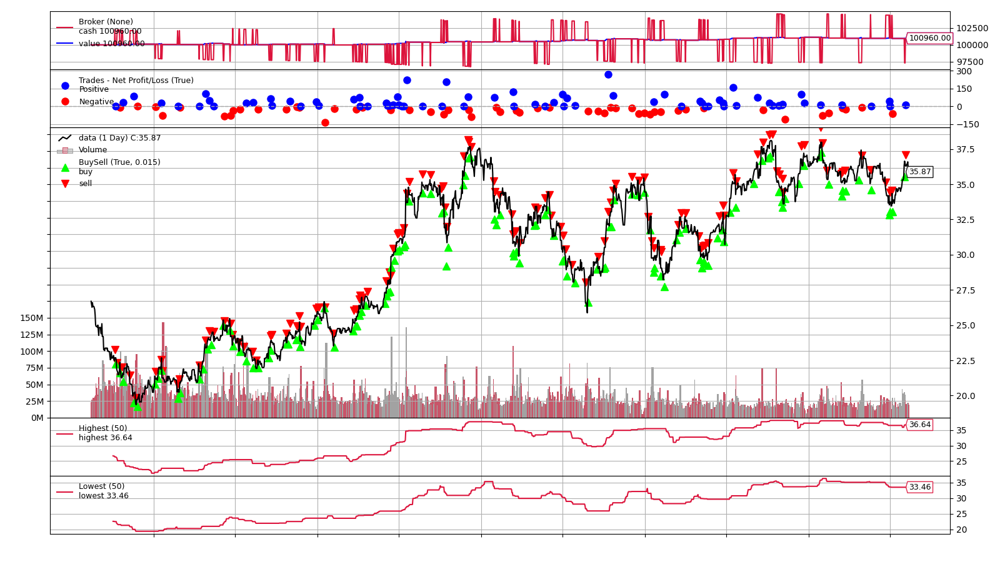

In [41]:
from IPython.display import Image
Image(filename='local/'+algo_name+'/model/chart.png')

## Refine your trading strategy (step 2 to 4). Once you are ready, move on to the next step.

# Step 5) Backtest on SageMaker and submit performance
Here we do the same backtesting, which was done localy in the previous step, just on the cluster. We push the local image to the container registry, then spin a Sagemaker cluster (you can define the number of instances in its config). This is serverless - i.e. AWS will take care of provisioning the compute resources

In [42]:
#Deploy Algo Image to ECS
!./build_and_push.sh $algo_name

WARNING! Using --password via the CLI is insecure. Use --password-stdin.
WARNING! Your password will be stored unencrypted in /home/ec2-user/.docker/config.json.
Configure a credential helper to remove this warning. See
https://docs.docker.com/engine/reference/commandline/login/#credentials-store

Login Succeeded
[+] Building 0.0s (0/1)                                          docker:default
[+] Building 0.1s (4/22)                                         docker:default
 => [internal] load build definition from Dockerfile                       0.0s
 => => transferring dockerfile: 1.08kB                                     0.0s
 => [internal] load metadata for docker.io/tensorflow/tensorflow:2.19.0    0.1s
 => [internal] load .dockerignore                                          0.0s
 => => transferring context: 2B                                            0.0s
 => [ 1/18] FROM docker.io/tensorflow/tensorflow:2.19.0@sha256:f24e8494d4  0.0s
 => [internal] load build context            

In [43]:
#Run Remote Forwardtest via SageMaker
import sagemaker as sage
from sagemaker import get_execution_role
from sagemaker.estimator import Estimator 

role = get_execution_role()
sess = sage.Session()

WORK_DIRECTORY = 'local/'+algo_name+'/input/data/training'
data_location = sess.upload_data(WORK_DIRECTORY, key_prefix='data')
print(data_location)

conf_file='local/'+algo_name+'/input/config/hyperparameters.json'
with open(conf_file, 'r') as f:
    config = json.load(f)
print(config)

prefix=algo_name
job_name=prefix.replace('_','-')

account = sess.boto_session.client('sts').get_caller_identity()['Account']
region = sess.boto_session.region_name
image = f'{account}.dkr.ecr.{region}.amazonaws.com/{prefix}:latest'

algo = sage.estimator.Estimator(
    image_uri=image,
    role=role,
    instance_count=1,
    instance_type='ml.m4.xlarge',
    output_path="s3://{}/output".format(sess.default_bucket()),
    sagemaker_session=sess,
    base_job_name=job_name,
    hyperparameters=config,
    metric_definitions=[
        {
            "Name": "algo:pnl",
            "Regex": "Total PnL:(.*?)]"
        },
        {
            "Name": "algo:sharpe_ratio",
            "Regex": "Sharpe Ratio:(.*?),"
        }
    ])
algo.fit(data_location)

INFO:sagemaker.telemetry.telemetry_logging:SageMaker Python SDK will collect telemetry to help us better understand our user's needs, diagnose issues, and deliver additional features.
To opt out of telemetry, please disable via TelemetryOptOut parameter in SDK defaults config. For more information, refer to https://sagemaker.readthedocs.io/en/stable/overview.html#configuring-and-using-defaults-with-the-sagemaker-python-sdk.
INFO:sagemaker:Creating training-job with name: algo-daily-breakout-2025-06-25-22-48-42-830


s3://sagemaker-us-east-1-616431823260/data
{'go_long': 'true', 'go_short': 'true', 'period': '50', 'size': '100', 'algo_name': 'algo_daily_breakout', 'user': 'user', 'account': '616431823260', 'region': 'us-east-1'}
2025-06-25 22:48:44 Starting - Starting the training job...
2025-06-25 22:48:57 Starting - Preparing the instances for training...
2025-06-25 22:49:21 Downloading - Downloading input data...
2025-06-25 22:50:17 Training - Training image download completed. Training in progress....
2025-06-25 22:50:37 Uploading - Uploading generated training modelimport:algo_daily_breakout
<class 'algo_daily_breakout.MyStrategy'>
[INIT]:config:/opt/ml/input/config/hyperparameters.json={'account': '616431823260', 'algo_name': 'algo_daily_breakout', 'go_long': 'true', 'go_short': 'true', 'period': '50', 'region': 'us-east-1', 'size': '100', 'user': 'user'}
[2012-10-01 23:59:59.999989] SOD:cash=100000.00
[2012-10-02 23:59:59.999989] SOD:cash=100000.00
[2012-10-03 23:59:59.999989] SOD:cash=10000

In [44]:
# Get Algo Metrics
from sagemaker.analytics import TrainingJobAnalytics

latest_job_name = algo.latest_training_job.job_name
metrics_dataframe = TrainingJobAnalytics(training_job_name=latest_job_name).dataframe()
metrics_dataframe

,timestamp,metric_name,value
0,0.0,algo:pnl,960.00
1,0.0,algo:sharpe_ratio,-4.55


tar: Ignoring unknown extended header keyword `LIBARCHIVE.creationtime'


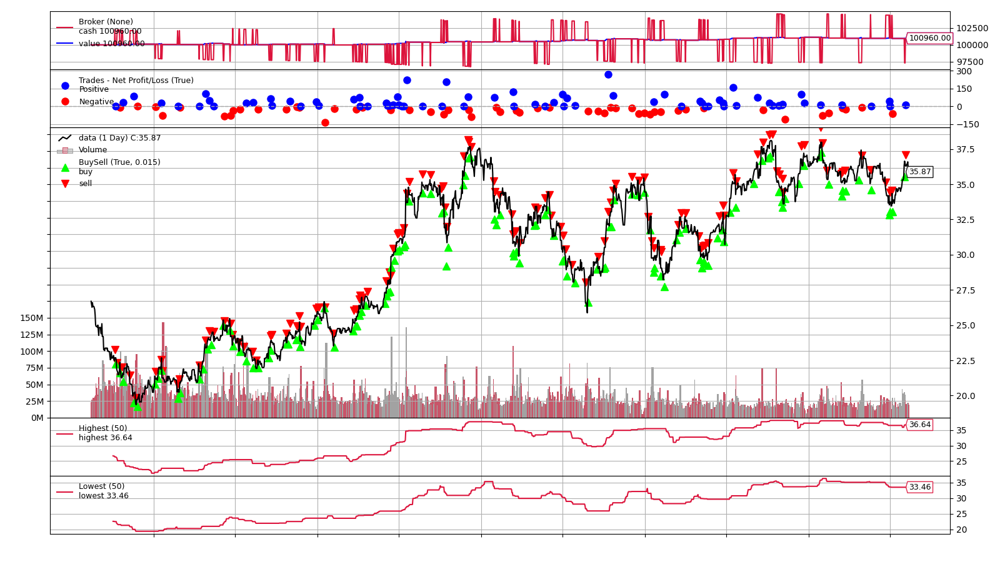

In [45]:
#Get Algo Chart from S3
model_name=algo.model_data.replace('s3://'+sess.default_bucket()+'/','')
import boto3
s3 = boto3.resource('s3')
my_bucket = s3.Bucket(sess.default_bucket())
my_bucket.download_file(model_name,'model.tar.gz')
!tar -xzf model.tar.gz
!rm model.tar.gz
from IPython.display import Image
Image(filename='chart.png') 